In [1]:
import os
import pandas as pd
import re

main_data_dir = 'action_data_22102024_ben'

# Lists to store data for all pairs
right_hand_data = []
right_leg_data = []
left_hand_data = []

def extract_number(filename):
    match = re.search(r'\d+', filename)  # Find the first sequence of digits in the filename
    return int(match.group()) if match else 0  # Convert to int, or return 0 if no match


for fileaction in os.listdir(main_data_dir):
    print(fileaction)
    ## adding this only to check each action one by one
    fileaction = 'basketball'
    print(fileaction)
    new_directory = os.path.join(main_data_dir, fileaction)
    
    # Check if it's a directory
    if os.path.isdir(new_directory):
        for filename in sorted(os.listdir(new_directory), key=extract_number):
            print(filename)
            
            # Check if the file contains "RIGHT_HAND"
            if 'right_hand' in filename and filename.endswith('.csv'):
                # Extract the number from the filename (e.g., "RIGHT_HAND0.csv" -> "0")
                print(filename)
                file_number = filename.replace('right_hand', '').replace('.csv', '')
                print(file_number)

                # Construct the corresponding RIGHT_LEG filename
                corresponding_leg_file = f'right_leg{file_number}.csv'
                corresponding_left_hand_file = f'left_hand{file_number}.csv'

                # Check if the corresponding RIGHT_LEG file exists in the same directory
                leg_file_path = os.path.join(new_directory, corresponding_leg_file)
                hand_file_path = os.path.join(new_directory, filename)
                ##left_hand_path = os.path.join(new_directory, corresponding_left_hand_file)
                
                if os.path.exists(leg_file_path):
                    print(f"Found corresponding pair: {filename}, {corresponding_leg_file}, {corresponding_left_hand_file}")

                    # Read both the RIGHT_HAND and RIGHT_LEG CSVs
                    hand_df = pd.read_csv(hand_file_path)
                    leg_df = pd.read_csv(leg_file_path)
                    ##left_hand_df = pd.read_csv(left_hand_path)

                    # Store the data in lists or process as needed
                    right_hand_data.append(hand_df)
                    right_leg_data.append(leg_df)
                    ##left_hand_data.append(left_hand_df)
                else:
                    print(f"Corresponding RIGHT_LEG/LEFT_HAND file not found for {filename}")
    break

basketball
basketball
right_hand0.csv
right_hand0.csv
0
Found corresponding pair: right_hand0.csv, right_leg0.csv, left_hand0.csv
right_leg0.csv
right_hand1.csv
right_hand1.csv
1
Found corresponding pair: right_hand1.csv, right_leg1.csv, left_hand1.csv
right_leg1.csv
right_hand2.csv
right_hand2.csv
2
Found corresponding pair: right_hand2.csv, right_leg2.csv, left_hand2.csv
right_leg2.csv
right_hand3.csv
right_hand3.csv
3
Found corresponding pair: right_hand3.csv, right_leg3.csv, left_hand3.csv
right_leg3.csv
right_hand4.csv
right_hand4.csv
4
Found corresponding pair: right_hand4.csv, right_leg4.csv, left_hand4.csv
right_leg4.csv
right_hand5.csv
right_hand5.csv
5
Found corresponding pair: right_hand5.csv, right_leg5.csv, left_hand5.csv
right_leg5.csv
right_hand6.csv
right_hand6.csv
6
Found corresponding pair: right_hand6.csv, right_leg6.csv, left_hand6.csv
right_leg6.csv
right_hand7.csv
right_hand7.csv
7
Found corresponding pair: right_hand7.csv, right_leg7.csv, left_hand7.csv
right_leg

In [2]:
print(f"Number of DataFrames in right_hand_data: {len(right_hand_data)}")
print(f"Number of DataFrames in right_leg_data: {len(right_leg_data)}")

Number of DataFrames in right_hand_data: 51
Number of DataFrames in right_leg_data: 51


In [3]:
for i, df in enumerate(right_hand_data):
    print(f"First few rows of right_hand_data[{i}]:")
    print(df.head())

for i, df in enumerate(right_leg_data):
    print(f"First few rows of right_leg_data[{i}]:")
    print(df.head())

First few rows of right_hand_data[0]:
           time        name    Ax     Ay     Az     Gx     Gy     Gz  seq_num
0  1.729589e+09  RIGHT_HAND -3800  15680  -8016    -20   5846   -667      227
1  1.729589e+09  RIGHT_HAND -5332  16992 -11540   1784   8731  -2644      229
2  1.729589e+09  RIGHT_HAND -7164  20840 -16360  11683   7505  -6960      231
3  1.729589e+09  RIGHT_HAND -8348  21160 -18452  23841   5593 -10562      233
4  1.729589e+09  RIGHT_HAND -8796  21836 -20780  32767  11065 -12421      235
First few rows of right_hand_data[1]:
           time        name     Ax     Ay     Az     Gx     Gy     Gz  seq_num
0  1.729589e+09  RIGHT_HAND  -2284  16712  -7016   2536   5590   -881       34
1  1.729589e+09  RIGHT_HAND  -2356  17068 -11692   2538    823  -1974       36
2  1.729589e+09  RIGHT_HAND  -7592  19940 -16548  11498  -7375  -6811       38
3  1.729589e+09  RIGHT_HAND -12216  24584 -21764  20030  12593 -11287       40
4  1.729589e+09  RIGHT_HAND  -7500  22924 -15404  32767  1345

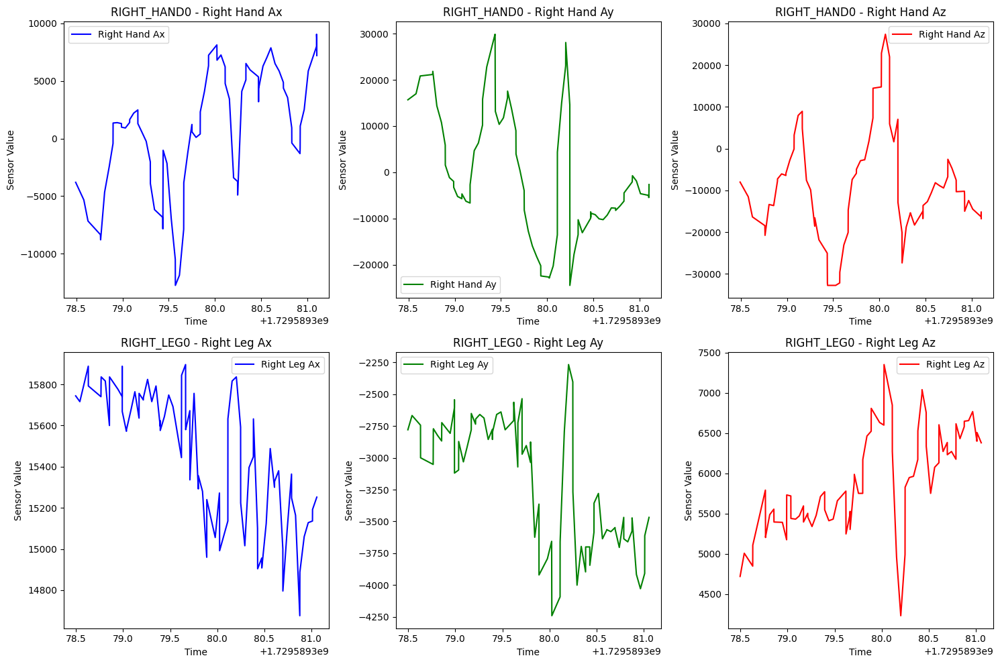

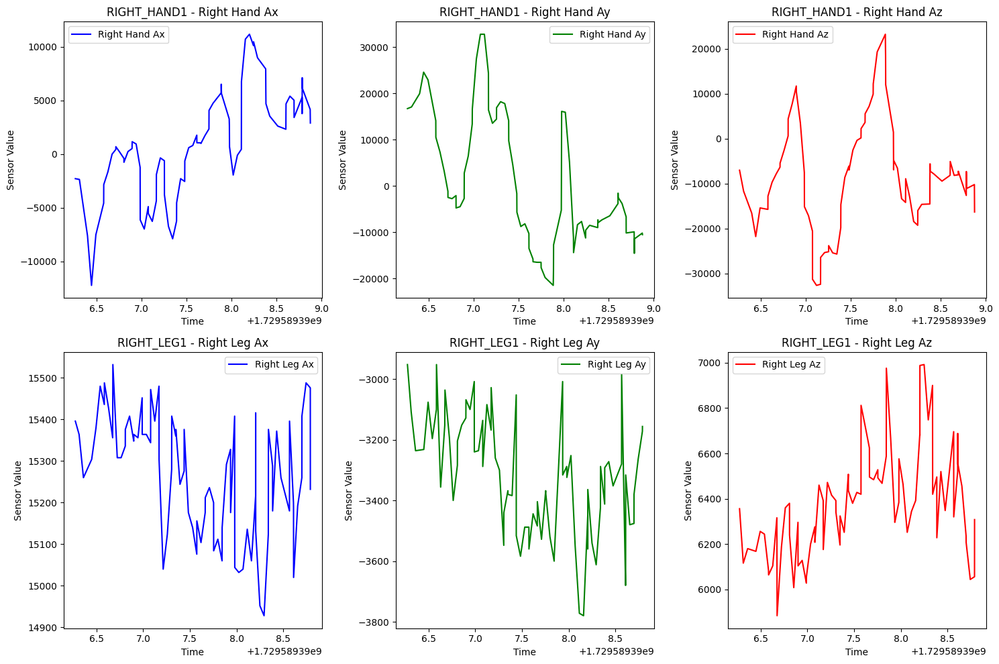

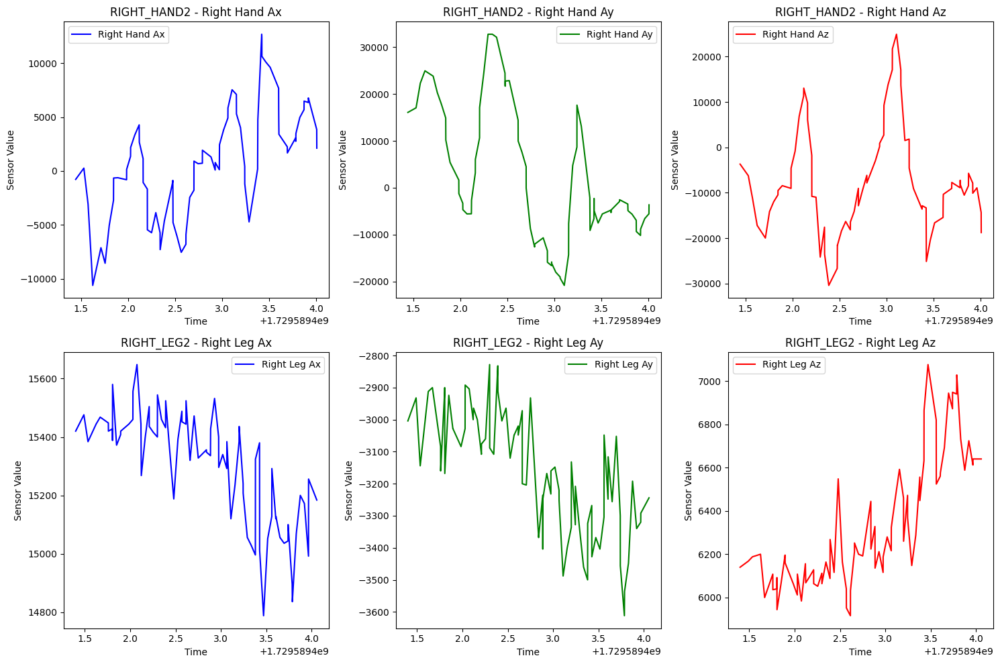

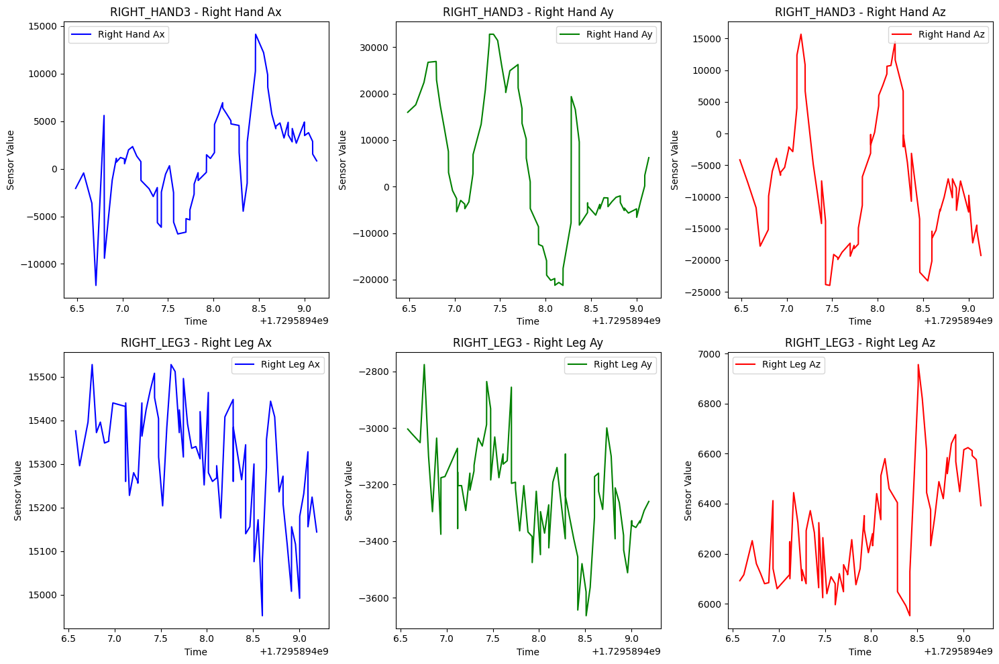

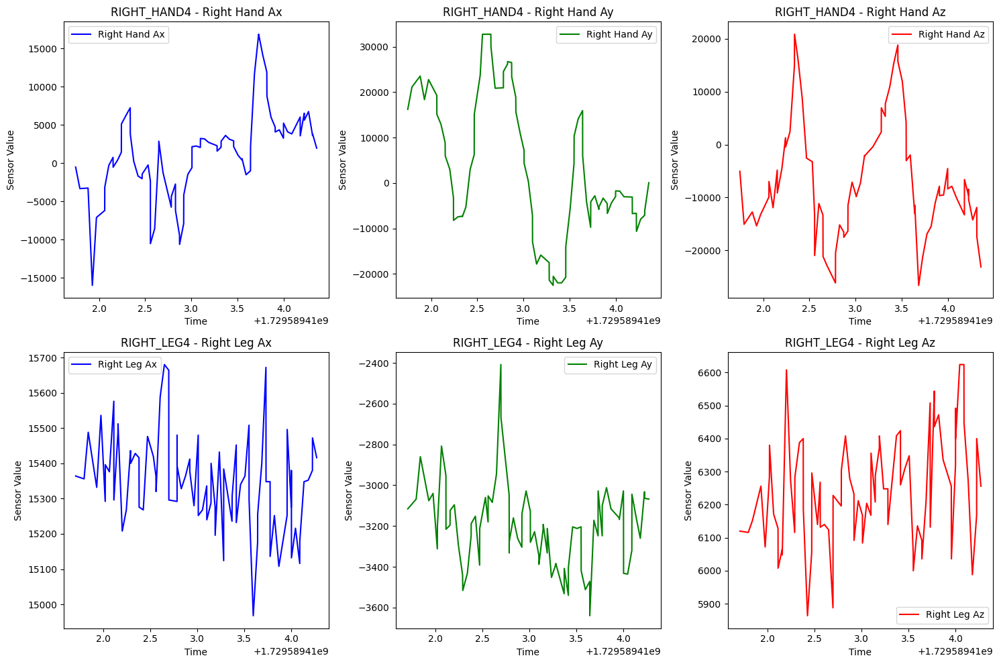

...

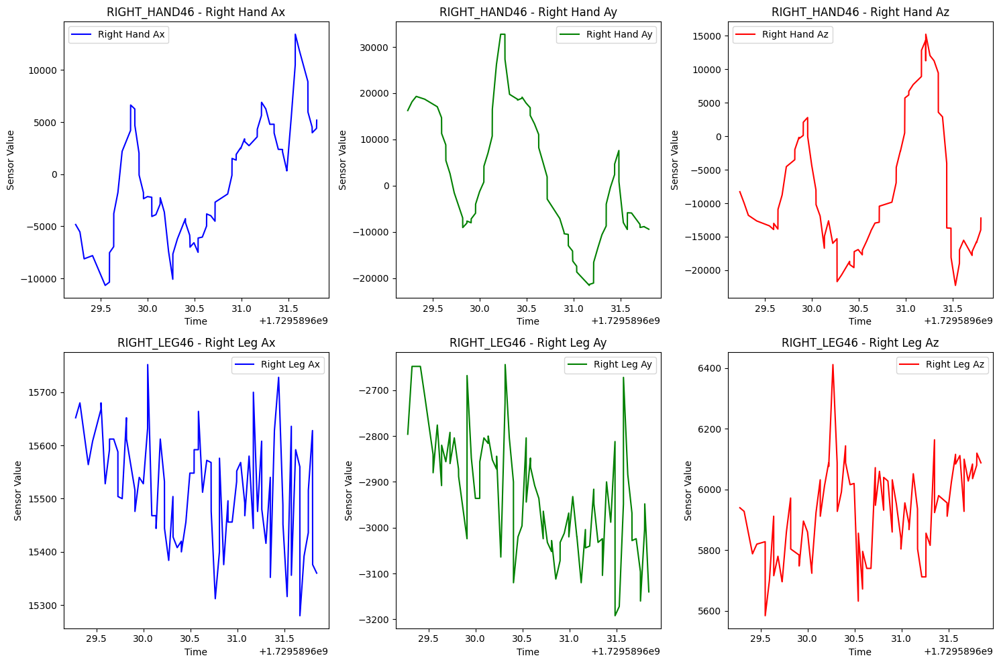

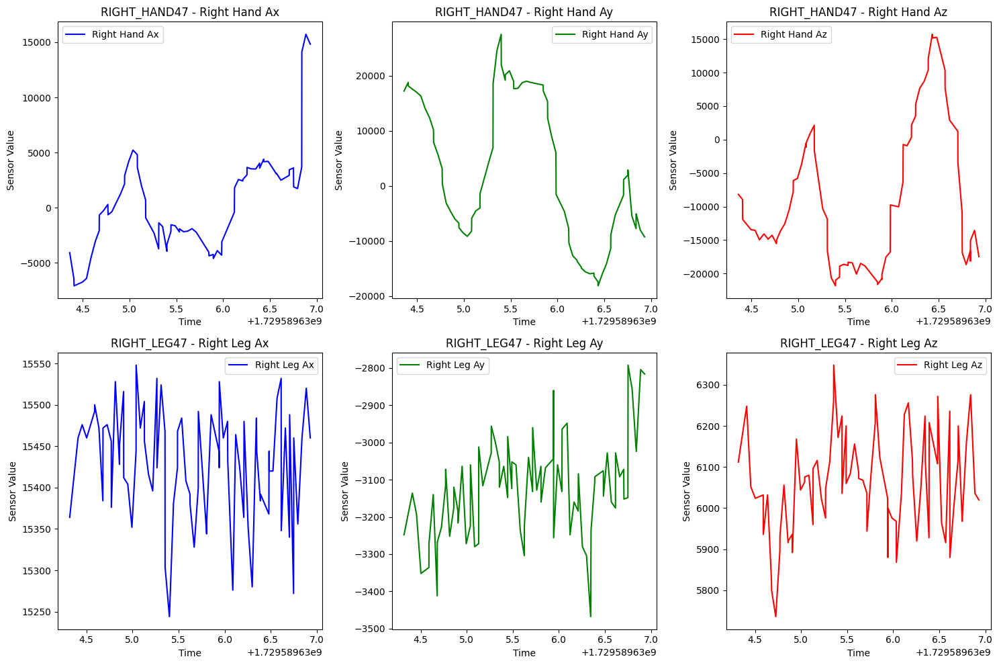

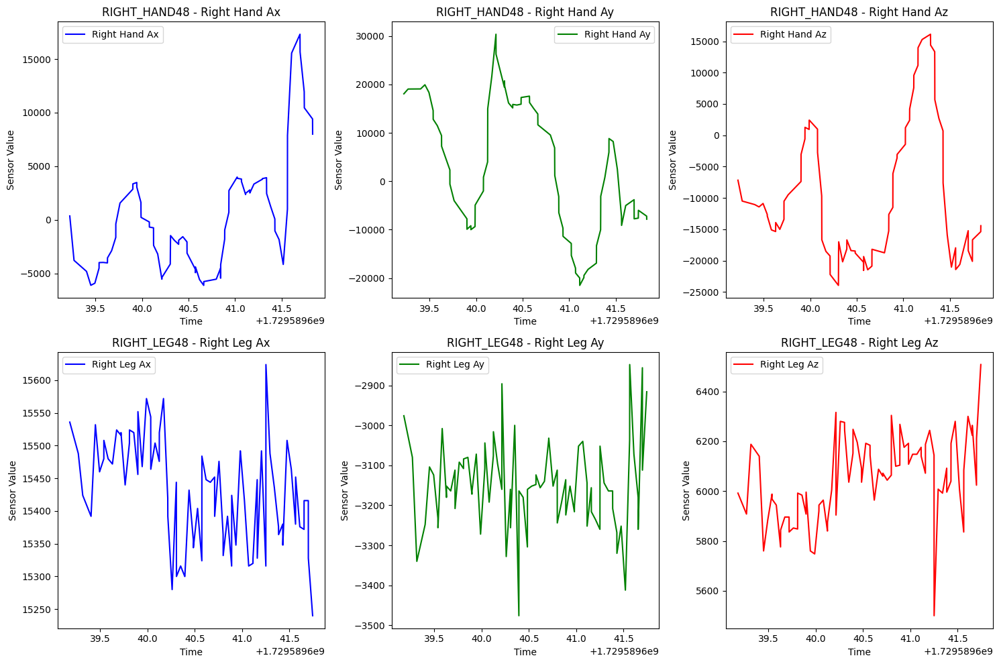

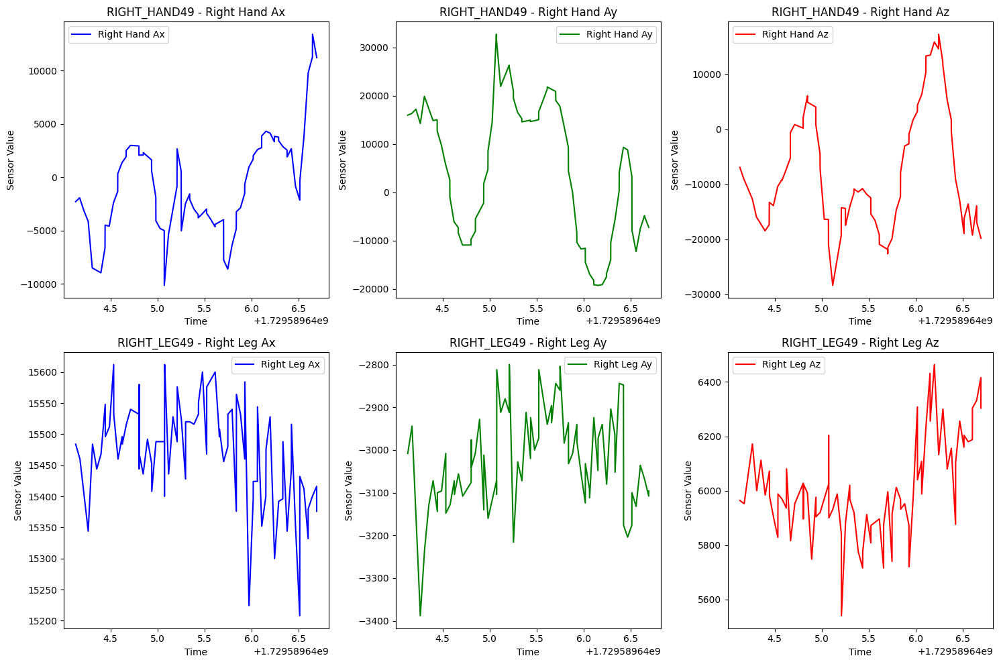

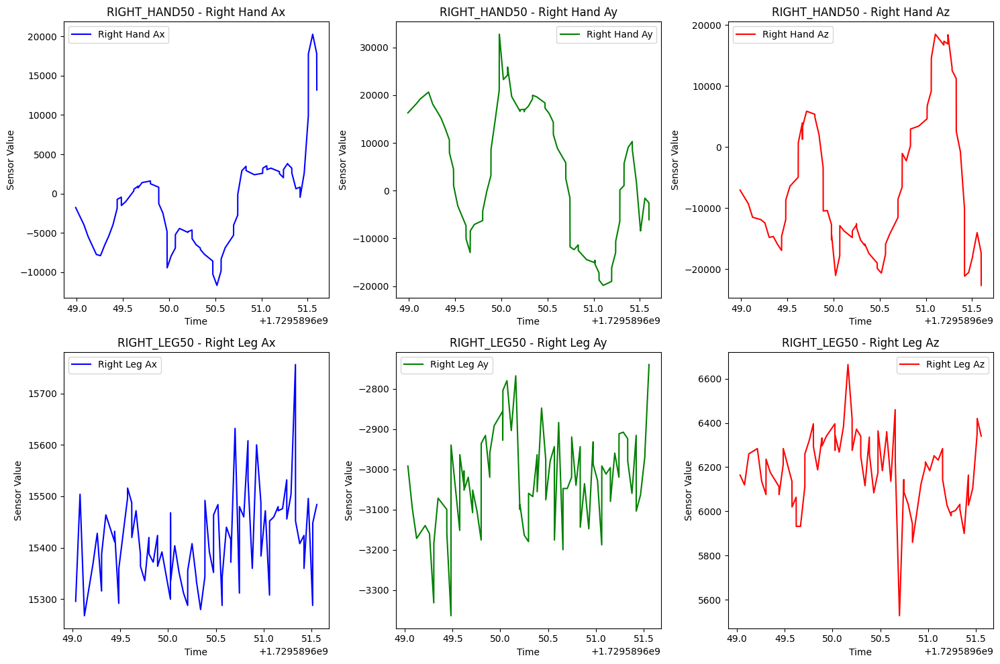

In [6]:
import matplotlib.pyplot as plt

# Loop through each right_hand and right_leg DataFrame in their arrays
for i in range(len(right_hand_data)):
    # Create a figure with multiple subplots for each feature (Acceleration and Gyroscope data)
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns for Ax, Ay, Az, Gx, Gy, Gz

    # Extract identifiers for titles
    hand_identifier = f'RIGHT_HAND{i}'
    leg_identifier = f'RIGHT_LEG{i}'

    # Plot RIGHT_HAND acceleration data (Ax, Ay, Az)
    axs[0, 0].plot(right_hand_data[i]['time'], right_hand_data[i]['Ax'], label='Right Hand Ax', color='b')
    axs[0, 0].set_title(f'{hand_identifier} - Right Hand Ax')
    axs[0, 1].plot(right_hand_data[i]['time'], right_hand_data[i]['Ay'], label='Right Hand Ay', color='g')
    axs[0, 1].set_title(f'{hand_identifier} - Right Hand Ay')
    axs[0, 2].plot(right_hand_data[i]['time'], right_hand_data[i]['Az'], label='Right Hand Az', color='r')
    axs[0, 2].set_title(f'{hand_identifier} - Right Hand Az')

    # Plot RIGHT_LEG acceleration data (Ax, Ay, Az)
    axs[1, 0].plot(right_leg_data[i]['time'], right_leg_data[i]['Ax'], label='Right Leg Ax', color='b')
    axs[1, 0].set_title(f'{leg_identifier} - Right Leg Ax')
    axs[1, 1].plot(right_leg_data[i]['time'], right_leg_data[i]['Ay'], label='Right Leg Ay', color='g')
    axs[1, 1].set_title(f'{leg_identifier} - Right Leg Ay')
    axs[1, 2].plot(right_leg_data[i]['time'], right_leg_data[i]['Az'], label='Right Leg Az', color='r')
    axs[1, 2].set_title(f'{leg_identifier} - Right Leg Az')

    # Add legends and axis labels for all subplots
    for ax in axs.flat:
        ax.legend()
        ax.set_xlabel('Time')
        ax.set_ylabel('Sensor Value')

    # Adjust layout
    plt.tight_layout()

    # Show plot for the current right_hand and right_leg pair
    plt.show()

In [4]:
right_hand_data[0]

for i, df in enumerate(right_hand_data):
    print(f"First few rows of right_hand_data[{i}]:")
    print(df.head())

for i, df in enumerate(right_leg_data):
    print(f"First few rows of right_leg_data[{i}]:")
    print(df.head())

First few rows of right_hand_data[0]:
           time        name    Ax     Ay     Az     Gx     Gy     Gz  seq_num
0  1.729589e+09  RIGHT_HAND -3800  15680  -8016    -20   5846   -667      227
1  1.729589e+09  RIGHT_HAND -5332  16992 -11540   1784   8731  -2644      229
2  1.729589e+09  RIGHT_HAND -7164  20840 -16360  11683   7505  -6960      231
3  1.729589e+09  RIGHT_HAND -8348  21160 -18452  23841   5593 -10562      233
4  1.729589e+09  RIGHT_HAND -8796  21836 -20780  32767  11065 -12421      235
First few rows of right_hand_data[1]:
           time        name     Ax     Ay     Az     Gx     Gy     Gz  seq_num
0  1.729589e+09  RIGHT_HAND  -2284  16712  -7016   2536   5590   -881       34
1  1.729589e+09  RIGHT_HAND  -2356  17068 -11692   2538    823  -1974       36
2  1.729589e+09  RIGHT_HAND  -7592  19940 -16548  11498  -7375  -6811       38
3  1.729589e+09  RIGHT_HAND -12216  24584 -21764  20030  12593 -11287       40
4  1.729589e+09  RIGHT_HAND  -7500  22924 -15404  32767  1345

In [5]:
import numpy as np
translate_forward = []
translate_backward = []
scaled = []
combined = []
noisy = []

for i, df in enumerate(right_hand_data):
    # Shift data forward by 1 row
    shifted_df = df.shift(periods=1)
    reverse_shifted_df = df.shift(periods=-1)
    shifted_df.iloc[0] = df.iloc[0]  # Replace the first row with the original first row
    reverse_shifted_df.iloc[-1] = df.iloc[-1]
    translate_forward.append(shifted_df)
    translate_backward.append(reverse_shifted_df)

    shifted_df = df.shift(periods=2)
    reverse_shifted_df = df.shift(periods=-2)
    shifted_df.fillna(method='bfill', inplace=True)
    reverse_shifted_df.fillna(method='ffill', inplace=True)
    translate_forward.append(shifted_df)
    translate_backward.append(reverse_shifted_df)

    shifted_df = df.shift(periods=3)
    reverse_shifted_df = df.shift(periods=-3)
    shifted_df.fillna(method='bfill', inplace=True)
    reverse_shifted_df.fillna(method='ffill', inplace=True)
    translate_forward.append(shifted_df)
    translate_backward.append(reverse_shifted_df)

    shifted_df = df.shift(periods=4)
    reverse_shifted_df = df.shift(periods=-4)
    shifted_df.fillna(method='bfill', inplace=True)
    reverse_shifted_df.fillna(method='ffill', inplace=True)
    translate_forward.append(shifted_df)
    translate_backward.append(reverse_shifted_df)

    shifted_df = df.shift(periods=5)
    reverse_shifted_df = df.shift(periods=-5)
    shifted_df.fillna(method='bfill', inplace=True)
    reverse_shifted_df.fillna(method='ffill', inplace=True)
    translate_forward.append(shifted_df)
    translate_backward.append(reverse_shifted_df)

    original_df = pd.DataFrame(df)

    # Function to perform basic scaling
    def basic_scaling(signal_df, scale_factor_range=(0.8, 1.2)):
        numeric_cols = signal_df.select_dtypes(include=[np.number]).columns.difference(['time', 'seq_num'])

        ##signal_df = signal_df.apply(pd.to_numeric, errors='coerce')
        scale_factor = np.random.uniform(scale_factor_range[0], scale_factor_range[1])
        ##return signal_df * scale_factor
        # Scale only the numeric columns
        signal_df[numeric_cols] = signal_df[numeric_cols] * scale_factor
        
        return signal_df

    # Function to add noise
    def add_noise(signal_df, noise_level=0.1):
        numeric_cols = signal_df.select_dtypes(include=[np.number]).columns.difference(['time', 'seq_num'])

        ##signal_df = signal_df.apply(pd.to_numeric, errors='coerce')
        ##noise = np.random.normal(0, noise_level, signal_df.shape)
        noise = np.random.normal(0, noise_level, signal_df[numeric_cols].shape)
        ##return signal_df + noise
        signal_df[numeric_cols] = signal_df[numeric_cols] + noise
    
        return signal_df

    # Function to perform combined magnitude warping
    def combined_magnitude_warp(signal_df, scale_factor_range=(0.8, 1.2), noise_level=0.1):
        # Scale the signal
        scaled_df = basic_scaling(signal_df, scale_factor_range)
        
        # Add noise to the scaled signal
        warped_df = add_noise(scaled_df, noise_level)
        
        return warped_df

    # Generate the scaled dataset
    scaled_df = basic_scaling(original_df)
    scaled.append(scaled_df)

    # Generate the combined warped dataset (scaled + noisy)
    combined_warped_df = combined_magnitude_warp(original_df)
    combined.append(combined_warped_df)
    # Generate the noisy dataset without scaling
    noisy_df = add_noise(original_df)
    noisy.append(noisy_df)

C:\Users\leezh\AppData\Local\Temp\ipykernel_17292\1634978449.py:19: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  shifted_df.fillna(method='bfill', inplace=True)
C:\Users\leezh\AppData\Local\Temp\ipykernel_17292\1634978449.py:20: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  reverse_shifted_df.fillna(method='ffill', inplace=True)
C:\Users\leezh\AppData\Local\Temp\ipykernel_17292\1634978449.py:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  shifted_df.fillna(method='bfill', inplace=True)
C:\Users\leezh\AppData\Local\Temp\ipykernel_17292\1634978449.py:27: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  reverse_shifted_df.filln

In [6]:
for i, df in enumerate(translate_forward):
    print(f"First few rows of right_hand_data[{i}]:")
    print(df.head())

for i, df in enumerate(scaled):
    print(f"First few rows of right_leg_data[{i}]:")
    print(df.tail())

First few rows of right_hand_data[0]:
           time        name      Ax       Ay       Az       Gx      Gy  \
0  1.729589e+09  RIGHT_HAND -3800.0  15680.0  -8016.0    -20.0  5846.0   
1  1.729589e+09  RIGHT_HAND -3800.0  15680.0  -8016.0    -20.0  5846.0   
2  1.729589e+09  RIGHT_HAND -5332.0  16992.0 -11540.0   1784.0  8731.0   
3  1.729589e+09  RIGHT_HAND -7164.0  20840.0 -16360.0  11683.0  7505.0   
4  1.729589e+09  RIGHT_HAND -8348.0  21160.0 -18452.0  23841.0  5593.0   

        Gz  seq_num  
0   -667.0    227.0  
1   -667.0    227.0  
2  -2644.0    229.0  
3  -6960.0    231.0  
4 -10562.0    233.0  
First few rows of right_hand_data[1]:
           time        name      Ax       Ay       Az       Gx      Gy  \
0  1.729589e+09  RIGHT_HAND -3800.0  15680.0  -8016.0    -20.0  5846.0   
1  1.729589e+09  RIGHT_HAND -3800.0  15680.0  -8016.0    -20.0  5846.0   
2  1.729589e+09  RIGHT_HAND -3800.0  15680.0  -8016.0    -20.0  5846.0   
3  1.729589e+09  RIGHT_HAND -5332.0  16992.0 -11540

In [7]:
print(f"Number of DataFrames in right_hand_data: {len(right_hand_data)}")
print(f"Number of DataFrames in right_leg_data: {len(right_leg_data)}")

print(f"Number of DataFrames in right_hand_data: {len(translate_forward)}")
print(f"Number of DataFrames in right_leg_data: {len(translate_backward)}")
print(f"Number of DataFrames in right_hand_data: {len(scaled)}")
print(f"Number of DataFrames in right_leg_data: {len(combined)}")
print(f"Number of DataFrames in right_hand_data: {len(noisy)}")

Number of DataFrames in right_hand_data: 51
Number of DataFrames in right_leg_data: 51
Number of DataFrames in right_hand_data: 255
Number of DataFrames in right_leg_data: 255
Number of DataFrames in right_hand_data: 51
Number of DataFrames in right_leg_data: 51
Number of DataFrames in right_hand_data: 51


In [43]:
# Initialize an empty list to store concatenated frames
concatenated_frames = []
new_hand_df = pd.DataFrame()
new_leg_df = pd.DataFrame()

# Loop through each frame (1st dimension)
for i in range(len(right_hand_data)):
    hand_frame = right_hand_data[i]  # Shape (80, 9)
    leg_frame = right_leg_data[i]    # Shape (80, 9)
    axes = ['Ax', 'Ay', 'Az', 'Gx', 'Gy', 'Gz']
    
    filtered_df = right_hand_data[i][axes]
    flattened_array = filtered_df.values.flatten()
    new_column_names = [f"RIGHT_HAND_{col}_{i}" for i in range(filtered_df.shape[0]) for col in filtered_df.columns]
    flattened_hand_df = pd.DataFrame([flattened_array], columns=new_column_names)

    filtered_df_leg = right_leg_data[i][axes]
    flattened_array_leg = filtered_df_leg.values.flatten()
    new_column_names_leg = [f"RIGHT_LEG_{col}_{i}" for i in range(filtered_df_leg.shape[0]) for col in filtered_df_leg.columns]
    flattened_leg_df = pd.DataFrame([flattened_array_leg], columns=new_column_names_leg)

    merged_frame = pd.concat([flattened_hand_df, flattened_leg_df], axis=1)
    concatenated_frames.append(merged_frame)

# Combine all frames into a single DataFrame
final_df = pd.concat(concatenated_frames, ignore_index=True)

# View the resulting DataFrame
print(final_df)

    RIGHT_HAND_Ax_0  RIGHT_HAND_Ay_0  RIGHT_HAND_Az_0  RIGHT_HAND_Gx_0  \
0             -3800            15680            -8016              -20   
1             -2284            16712            -7016             2536   
2              -780            16080            -3684             -451   
3             -2064            15984            -4152             -413   
4              -512            16232            -5044              228   
5             -2664            16372            -4952             -736   
6             -1224            16324            -4052             -720   
7             -1664            15584            -5048              590   
8             -1332            15452            -2568             1783   
9             -2220            15900            -3112             -247   
10             -284            17220            -6016              503   
11            -2164            16000            -3248             -682   
12            -1028            17044  

In [32]:
hand_frame = right_hand_data[i]
hand_df = pd.DataFrame(hand_frame)

new = pd.DataFrame()
axes = ['Ax', 'Ay', 'Az', 'Gx', 'Gy', 'Gz']
    
# Iterate through each axis and calculate features

for axis in axes:
    new[f'RIGHT_HAND_{axis}'] = hand_df[f'{axis}']


print(new)

    RIGHT_HAND_Ax  RIGHT_HAND_Ay  RIGHT_HAND_Az  RIGHT_HAND_Gx  RIGHT_HAND_Gy  \
0           -1768          16288          -7052           2000           1045   
1           -3952          18152          -9280           3649          -1435   
2           -5468          19232         -11500          10539            689   
3           -7736          20648         -11880          16318           -979   
4           -7892          18128         -12440          22866           8161   
..            ...            ...            ...            ...            ...   
75           9892          -8440         -17848          -8763          32767   
76          17756          -8388         -17644         -18143          31582   
77          20268          -1580         -14020         -12011           5921   
78          17800          -2548         -17324           1703         -14042   
79          13176          -6100         -22664           2494         -20486   

    RIGHT_HAND_Gz  
0      

In [44]:
right_hand_data[0]

,time,name,Ax,Ay,Az,Gx,Gy,Gz,seq_num
0,1.729589e+09,RIGHT_HAND,-3800,15680,-8016,-20,5846,-667,227
1,1.729589e+09,RIGHT_HAND,-5332,16992,-11540,1784,8731,-2644,229
2,1.729589e+09,RIGHT_HAND,-7164,20840,-16360,11683,7505,-6960,231
3,1.729589e+09,RIGHT_HAND,-8348,21160,-18452,23841,5593,-10562,233
4,1.729589e+09,RIGHT_HAND,-8796,21836,-20780,32767,11065,-12421,235
...,...,...,...,...,...,...,...,...,...
75,1.729589e+09,RIGHT_HAND,5876,-4628,-14496,-1007,4445,-8676,52
76,1.729589e+09,RIGHT_HAND,8012,-5004,-16304,-8710,2030,-9784,53
77,1.729589e+09,RIGHT_HAND,9064,-5460,-16268,-9896,-4512,-8634,54
78,1.729589e+09,RIGHT_HAND,8740,-3780,-15168,-14600,-10795,-8338,55


In [41]:
import pandas as pd

# Assuming 'df' is your DataFrame with columns like 'RIGHT_HAND_Ax', 'RIGHT_HAND_Ay', etc.

# Define the axes you want to keep
axes = ['Ax', 'Ay', 'Az', 'Gx', 'Gy', 'Gz']
# Filter the DataFrame to include only the selected columns
filtered_df = right_hand_data[i][axes]
print(filtered_df)
# Flatten the DataFrame into a 1D array
flattened_array = filtered_df.values.flatten()

# Create new column names by appending the row number to each selected axis column
new_column_names = [f"RIGHT_HAND_{col}_{i}" for i in range(filtered_df.shape[0]) for col in filtered_df.columns]

# Convert the 1D array into a DataFrame with the new column names
flattened_df = pd.DataFrame([flattened_array], columns=new_column_names)

# View the resulting single row DataFrame
print(flattened_df)

       Ax     Ay     Az     Gx     Gy     Gz
0   -1768  16288  -7052   2000   1045   1407
1   -3952  18152  -9280   3649  -1435    -88
2   -5468  19232 -11500  10539    689  -2951
3   -7736  20648 -11880  16318   -979  -7328
4   -7892  18128 -12440  22866   8161 -11028
..    ...    ...    ...    ...    ...    ...
75   9892  -8440 -17848  -8763  32767   1562
76  17756  -8388 -17644 -18143  31582  -5447
77  20268  -1580 -14020 -12011   5921  -5995
78  17800  -2548 -17324   1703 -14042  -1840
79  13176  -6100 -22664   2494 -20486  -1455

[80 rows x 6 columns]
   RIGHT_HAND_Ax_0  RIGHT_HAND_Ay_0  RIGHT_HAND_Az_0  RIGHT_HAND_Gx_0  \
0            -1768            16288            -7052             2000   

   RIGHT_HAND_Gy_0  RIGHT_HAND_Gz_0  RIGHT_HAND_Ax_1  RIGHT_HAND_Ay_1  \
0             1045             1407            -3952            18152   

   RIGHT_HAND_Az_1  RIGHT_HAND_Gx_1  ...  RIGHT_HAND_Az_78  RIGHT_HAND_Gx_78  \
0            -9280             3649  ...            -17324     

In [8]:
import os
import pandas as pd
import numpy as np

# Specify the directories for the main data and labels
main_data_dir = 'action_data_22102024_ben'

In [ ]:
bluno1df = pd.DataFrame()
bluno3df = pd.DataFrame()
combined_df = pd.DataFrame()

os.listdir(main_data_dir)

import numpy as np

translate_forward = []
translate_backward = []
scaled = []
combined = []
noisy = []

def extract_global_features(df, bluno, counter):
    for i, df in enumerate(right_hand_data):
        # Shift data forward by 1 row
        shifted_df = df.shift(periods=1)
        reverse_shifted_df = df.shift(periods=-1)
        shifted_df.iloc[0] = df.iloc[0]  # Replace the first row with the original first row
        reverse_shifted_df.iloc[-1] = df.iloc[-1]
        translate_forward.append(shifted_df)
        translate_backward.append(reverse_shifted_df)

        shifted_df = df.shift(periods=2)
        reverse_shifted_df = df.shift(periods=-2)
        shifted_df.fillna(method='bfill', inplace=True)
        reverse_shifted_df.fillna(method='ffill', inplace=True)
        translate_forward.append(shifted_df)
        translate_backward.append(reverse_shifted_df)

        shifted_df = df.shift(periods=3)
        reverse_shifted_df = df.shift(periods=-3)
        shifted_df.fillna(method='bfill', inplace=True)
        reverse_shifted_df.fillna(method='ffill', inplace=True)
        translate_forward.append(shifted_df)
        translate_backward.append(reverse_shifted_df)

        shifted_df = df.shift(periods=4)
        reverse_shifted_df = df.shift(periods=-4)
        shifted_df.fillna(method='bfill', inplace=True)
        reverse_shifted_df.fillna(method='ffill', inplace=True)
        translate_forward.append(shifted_df)
        translate_backward.append(reverse_shifted_df)

        shifted_df = df.shift(periods=5)
        reverse_shifted_df = df.shift(periods=-5)
        shifted_df.fillna(method='bfill', inplace=True)
        reverse_shifted_df.fillna(method='ffill', inplace=True)
        translate_forward.append(shifted_df)
        translate_backward.append(reverse_shifted_df)

        original_df = pd.DataFrame(df)

    # Function to perform basic scaling
    def basic_scaling(signal_df, scale_factor_range=(0.8, 1.2)):
        numeric_cols = signal_df.select_dtypes(include=[np.number]).columns.difference(['time', 'seq_num'])

        ##signal_df = signal_df.apply(pd.to_numeric, errors='coerce')
        scale_factor = np.random.uniform(scale_factor_range[0], scale_factor_range[1])
        ##return signal_df * scale_factor
        # Scale only the numeric columns
        signal_df[numeric_cols] = signal_df[numeric_cols] * scale_factor
        
        return signal_df

    # Function to add noise
    def add_noise(signal_df, noise_level=0.1):
        numeric_cols = signal_df.select_dtypes(include=[np.number]).columns.difference(['time', 'seq_num'])

        ##signal_df = signal_df.apply(pd.to_numeric, errors='coerce')
        ##noise = np.random.normal(0, noise_level, signal_df.shape)
        noise = np.random.normal(0, noise_level, signal_df[numeric_cols].shape)
        ##return signal_df + noise
        signal_df[numeric_cols] = signal_df[numeric_cols] + noise
    
        return signal_df

    # Function to perform combined magnitude warping
    def combined_magnitude_warp(signal_df, scale_factor_range=(0.8, 1.2), noise_level=0.1):
        # Scale the signal
        scaled_df = basic_scaling(signal_df, scale_factor_range)
        
        # Add noise to the scaled signal
        warped_df = add_noise(scaled_df, noise_level)
        
        return warped_df

    # Generate the scaled dataset
    scaled_df = basic_scaling(original_df)
    scaled.append(scaled_df)

    # Generate the combined warped dataset (scaled + noisy)
    combined_warped_df = combined_magnitude_warp(original_df)
    combined.append(combined_warped_df)
    # Generate the noisy dataset without scaling
    noisy_df = add_noise(original_df)
    noisy.append(noisy_df)

##############################################################
# Value corresponding to each action
# Not Action = 0 # but for now this wont be included
# Basketball = 1
# Bowling = 2
# Logout = 3
# Rainbomb = 4
# Reload = 5
# Shield = 6
# Soccer = 7
# Volleyball = 8
##############################################################

counter = 0
# Loop through each file in the main data directory
for fileaction in os.listdir(main_data_dir):
    new_directory = os.path.join(main_data_dir, fileaction)
    print(new_directory)
    for filename in os.listdir(new_directory):
        print(filename)
        if 'right_hand' in filename and filename.endswith('.csv'):
            ##print(filename)
            file_number = filename.replace('right_hand', '').replace('.csv', '')
            ##print(file_number)
            corresponding_leg_file = f'right_leg{file_number}.csv'
            leg_file_path = os.path.join(new_directory, corresponding_leg_file)
            main_file_path = os.path.join(new_directory, filename)

            if os.path.exists(leg_file_path):
                    print(f"Found corresponding pair: {filename} and {corresponding_leg_file}")

                    # Read both the RIGHT_HAND and RIGHT_LEG CSVs
                    separate_bluno_1 = pd.read_csv(main_file_path)
                    separate_bluno_3 = pd.read_csv(leg_file_path)
                    separate_bluno_1.columns = ['Timestamp', 'Device', 'Acceleration_X', 'Acceleration_Y', 'Acceleration_Z',
              'Gyro_X', 'Gyro_Y', 'Gyro_Z', 'Index']
                    separate_bluno_3.columns = ['Timestamp', 'Device', 'Acceleration_X', 'Acceleration_Y', 'Acceleration_Z',
              'Gyro_X', 'Gyro_Y', 'Gyro_Z', 'Index']

                    bluno1_feature = extract_global_features(separate_bluno_1, "RIGHT_HAND", counter)
                    bluno3_feature = extract_global_features(separate_bluno_3, "RIGHT_LEG", counter)
                    
                    # Convert the global features to a DataFrame (1 row)
                    bluno1_feature = pd.DataFrame([bluno1_feature])
                    bluno3_feature = pd.DataFrame([bluno3_feature])
                    merged_bluno = pd.concat([bluno1_feature, bluno3_feature], axis=1)
                    merged_bluno['Move'] = counter
                    combined_df = pd.concat([combined_df, merged_bluno], ignore_index=True)
                    ##bluno1df = pd.concat([bluno1df, bluno1_feature], ignore_index=True)
                    ##bluno3df = pd.concat([bluno3df, bluno3_feature], ignore_index=True)
            else:
                    print(f"Corresponding RIGHT_LEG file not found for {filename}")
        
    counter += 1
    ##break

##combined_df = pd.concat([bluno1df, bluno3df], axis=1)